In [1]:

import pandas as pd
import pickle
import dask.dataframe as dd

from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras.optimizers import SGD, Adam

import matplotlib.pyplot as plt
from keras import initializers


import numpy as np



df = dd.read_csv("../Dataset1/*").compute()
df = df.reset_index(drop=True)

# df = pd.read_csv("/content/drive/My Drive/Year4Project/*")

X = df.iloc[:,:400]
Y = df.iloc[:,400:]


x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.5, random_state = 42)
x_train, x_val, y_train, y_val = train_test_split(X, Y, train_size=0.5, random_state = 42)



Using TensorFlow backend.


In [2]:
def definingDataSize(train_size, n_epochs=300,):

  x_train_red = x_train.sample(train_size, random_state=42)
  y_train_red = y_train.loc[x_train_red.index]

  early_stop = EarlyStopping(monitor='val_loss', patience=65, verbose=1, restore_best_weights=True)
  reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=30, verbose=1,)

  opt = Adam()

  model = Sequential()
  model.add(Dense(300, input_dim=400, kernel_initializer=initializers.normal(seed=42), activation='relu'))
  model.add(Dense(200, kernel_initializer=initializers.normal(seed=42), activation='relu'))
  model.add(Dense(100, kernel_initializer=initializers.normal(seed=42), activation='relu'))
  model.add(Dense(75, kernel_initializer=initializers.normal(seed=42), activation='relu'))
  model.add(Dense(50, kernel_initializer=initializers.normal(seed=42), activation='relu'))
  model.add(Dense(25, kernel_initializer=initializers.normal(seed=42), activation='relu'))
  model.add(Dense(3, kernel_initializer=initializers.normal(seed=42),))
  # Compile model
  model.compile(loss='mean_squared_error', optimizer=opt,)



  history = model.fit(x=x_train_red, y=y_train_red, validation_data = (x_val, y_val), epochs=n_epochs, verbose=0)
  
  pd.DataFrame(history.history).to_csv('../BatchSizeReduction/model_ts{}.csv'.format(train_size))

  model.save('../BatchSizeReduction/model_ts{}.h5'.format(train_size))

  return history


for i in np.logspace(1,3,30, dtype=np.int64):
  definingDataSize(i)


In [3]:
from keras.models import load_model
import numpy as np
import pandas as pd

losses = []

for train_size in np.logspace(1,3,30, dtype=np.int64):
  history = pd.read_csv('../BatchSizeReduction/model_ts{}.csv'.format(train_size))
  losses.append(history)
losses = [loss.drop(loss.columns[0], axis=1) for loss in losses]


In [4]:
import plotly.graph_objects as go

Z = np.log10(pd.concat(losses, keys=np.logspace(1,3,30, dtype=np.int64))['val_loss'].unstack().T.values.flatten())

Y, X = np.meshgrid(np.logspace(1,3,30, dtype=np.int64), list(range(300)))


fig = go.Figure(data=[go.Mesh3d(x=X.flatten(), y=Y.flatten(), z=Z,
                   colorscale = 'rdbu',
                   intensity=Z)])


fig.show()

In [5]:
import plotly.graph_objects as go

Z = np.log10(pd.concat(losses, keys=np.logspace(1,3,30, dtype=np.int64))['loss'].unstack().T.values.flatten())

Y, X = np.meshgrid(np.logspace(1,3,30, dtype=np.int64), list(range(300)))


fig = go.Figure(data=[go.Mesh3d(x=X.flatten(), y=Y.flatten(), z=Z,
                   colorscale = 'rdbu',
                   intensity=Z)])


fig.show()

In [6]:

from keras.models import load_model

validation_loss = []

for train_size in np.logspace(1,3,30, dtype=np.int64):
  model = load_model('../BatchSizeReduction/model_ts{}.h5'.format(train_size))
  score = model.evaluate(x_test, y_test)
  validation_loss.append(score)



Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
5000/5000 [==============================] - 2s 359us/step


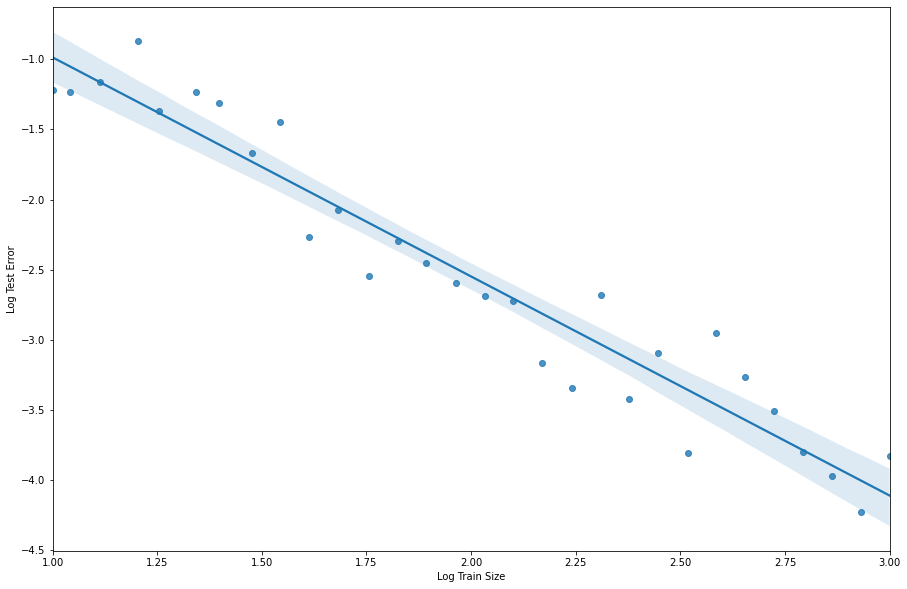

In [7]:
import seaborn as sns
plt.figure(figsize=(15,10))
ax = sns.regplot(x = np.log10(np.logspace(1,3,30, dtype=np.int64)), y = np.log10(validation_loss), order=1)
ax.set(xlabel='Log Train Size', ylabel='Log Test Error')
plt.savefig('../BatchSizeReduction/Graphs/TrainSizeVsValErr.png')
plt.show()

In [9]:
from sklearn.linear_model import LinearRegression

x1 = np.log10(np.logspace(1,3,30, dtype=np.int64))
y1 = np.log10(validation_loss)

lr = LinearRegression()
lr.fit(x1[:, None], y1[:, None])

print(lr.coef_[0], lr.intercept_, lr.score(x1[:, None], y1[:, None]))

[-1.56305866] [0.57738429] 0.925549335652792


Now Investigating if model can perform outside of the range it was trained on. By removing all values of radii less than 1.4 from training set.

In [10]:
import seaborn as sns

X = df.iloc[:,:400]
Y = df.iloc[:,400:]

y_test = Y[(Y['label_1']<1.5)|(Y['label_2']<1.5)|(Y['label_3']<1.5)]
x_test = X.loc[y_test.index]

x_train = X.drop(x_test.index)
y_train = Y.drop(y_test.index)


x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, train_size=0.5, random_state = 42)


reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=30, verbose=1,)
early_stop = EarlyStopping(monitor='val_loss', patience=61, verbose=1, restore_best_weights=True)
opt = Adam()

model = Sequential()
model.add(Dense(300, input_dim=400, kernel_initializer=initializers.normal(seed=42), activation='relu'))
model.add(Dense(200, kernel_initializer=initializers.normal(seed=42), activation='relu'))
model.add(Dense(100, kernel_initializer=initializers.normal(seed=42), activation='relu'))
model.add(Dense(75, kernel_initializer=initializers.normal(seed=42), activation='relu'))
model.add(Dense(50, kernel_initializer=initializers.normal(seed=42), activation='relu'))
model.add(Dense(25, kernel_initializer=initializers.normal(seed=42), activation='relu'))
model.add(Dense(3, kernel_initializer=initializers.normal(seed=42),))
# Compile model
model.compile(loss='mean_squared_error', optimizer=opt,)

history = model.fit(x=x_train, y=y_train, validation_data = (x_val, y_val), epochs=100, verbose=1, 
                    callbacks=[reduce_lr, early_stop])


model.save('../Models/NN_Extrapolate.h5')


Train on 619 samples, validate on 619 samples
Epoch 1/100
619/619 [==============================] - 3s 5ms/step - loss: 1.1542 - val_loss: 0.2220
Epoch 2/100
619/619 [==============================] - 0s 251us/step - loss: 0.0985 - val_loss: 0.0629
Epoch 3/100
619/619 [==============================] - 0s 298us/step - loss: 0.0531 - val_loss: 0.0519
Epoch 4/100
619/619 [==============================] - 0s 282us/step - loss: 0.0406 - val_loss: 0.0336
Epoch 5/100
619/619 [==============================] - 0s 338us/step - loss: 0.0275 - val_loss: 0.0311
Epoch 6/100
619/619 [==============================] - 0s 451us/step - loss: 0.0240 - val_loss: 0.0237
Epoch 7/100
619/619 [==============================] - 0s 384us/step - loss: 0.0219 - val_loss: 0.0235
Epoch 8/100
619/619 [==============================] - 0s 367us/step - loss: 0.0212 - val_loss: 0.0218
Epoch 9/100
619/619 [==============================] - 0s 269us/step - loss: 0.0202 - val_loss: 0.0226
Epoch 10/100
619/619 [=======

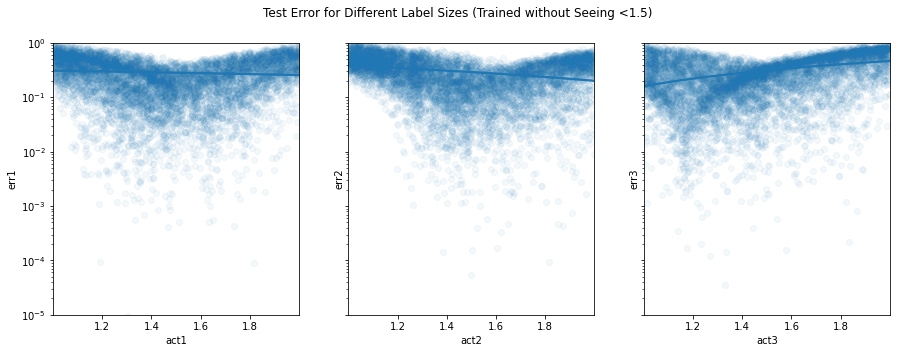

In [11]:
from keras.models import load_model
import seaborn as sns

model = load_model('../Models/NN_Extrapolate.h5')

df1 = pd.concat([pd.DataFrame(model.predict(x_test)), pd.DataFrame(y_test)], axis=1)
df1.columns = ['pred1', 'pred2', 'pred3', 'act1', 'act2', 'act3']

df1['err1'] = (df1['pred1'] - df1['act1']).abs()
df1['err2'] = (df1['pred2'] - df1['act2']).abs()
df1['err3'] = (df1['pred3'] - df1['act3']).abs()

fig, ax = plt.subplots(ncols=3, figsize=(15,5), sharey=True)
sns.regplot(x = df1['act1'], y = df1['err1'], ax=ax[0], scatter_kws={'alpha':0.05})
sns.regplot(x = df1['act2'], y = df1['err2'], ax=ax[1], scatter_kws={'alpha':0.05})
sns.regplot(x = df1['act3'], y = df1['err3'], ax=ax[2], scatter_kws={'alpha':0.05})
# ax[0].hist2d(df1['act1'], df1['err1'], cmap="Reds", bins=50)
# ax[1].hist2d(df1['act2'], df1['err2'], cmap="Reds", bins=50)
# ax[2].hist2d(df1['act3'], df1['err3'], cmap="Reds", bins=50)
ax[0].set(yscale="log")
ax[1].set(yscale="log")
ax[2].set(yscale="log")
ax[0].set_ylim([10**-5, 10**0])

fig.suptitle('Test Error for Different Label Sizes (Trained without Seeing <1.5)')
plt.savefig('../BatchSizeReduction/Graphs/ExtrapolateValErr.png')
plt.show()


In [12]:
model.evaluate(x_train, y_train), model.evaluate(x_test, y_test)

8762/8762 [==============================] - 1s 82us/step


(9.356865846767859e-05, 0.02930060636079548)

These results are quite interesting, it seems that the model struggles much more on values below 1.4, but more interestingly this doesn't seem to occur for the 3rd radii.

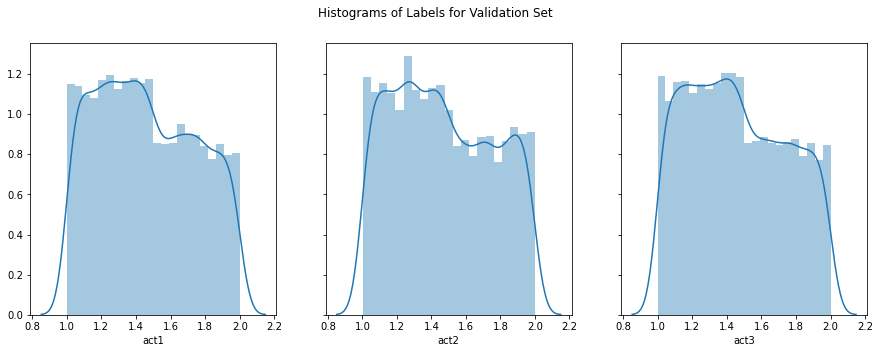

In [13]:
fig, ax = plt.subplots(ncols=3, figsize=(15,5), sharey=True)
sns.distplot(df1['act1'], ax=ax[0])
sns.distplot(df1['act2'], ax=ax[1])
sns.distplot(df1['act3'], ax=ax[2])
fig.suptitle('Histograms of Labels for Validation Set')
plt.show()

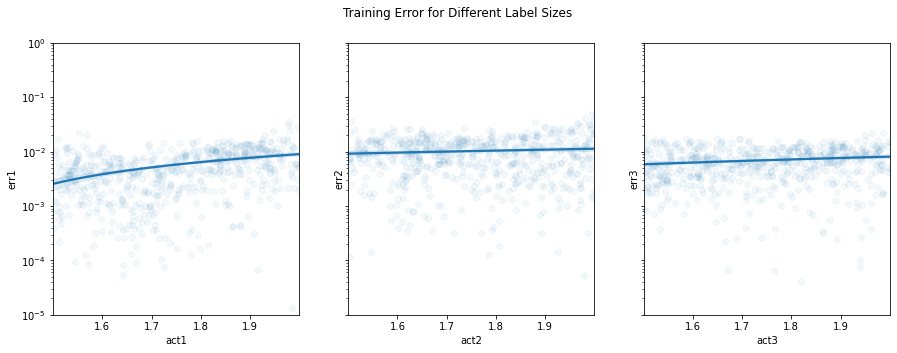

In [14]:
df2 = pd.concat([pd.DataFrame(model.predict(x_train)), pd.DataFrame(y_train.values)], axis=1)
df2.columns = ['pred1', 'pred2', 'pred3', 'act1', 'act2', 'act3']

df2['err1'] = (df2['pred1'] - df2['act1']).abs()
df2['err2'] = (df2['pred2'] - df2['act2']).abs()
df2['err3'] = (df2['pred3'] - df2['act3']).abs()

fig, ax = plt.subplots(ncols=3, figsize=(15,5), sharey=True)
sns.regplot(x = df2['act1'], y = df2['err1'], ax=ax[0],scatter_kws={'alpha':0.05})
sns.regplot(x = df2['act2'], y = df2['err2'], ax=ax[1],scatter_kws={'alpha':0.05})
sns.regplot(x = df2['act3'], y = df2['err3'], ax=ax[2],scatter_kws={'alpha':0.05})
ax[0].set(yscale="log")
ax[1].set(yscale="log")
ax[2].set(yscale="log")
ax[0].set_ylim([10**-5, 10**0])

fig.suptitle('Training Error for Different Label Sizes')
plt.savefig('../BatchSizeReduction/Graphs/ExtrapolateTrainErr.png')


plt.show()

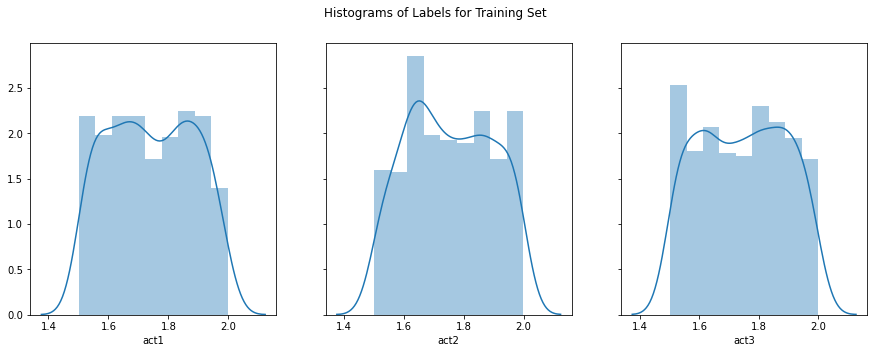

In [15]:
fig, ax = plt.subplots(ncols=3, figsize=(15,5), sharey=True)
sns.distplot(df2['act1'], ax=ax[0])
sns.distplot(df2['act2'], ax=ax[1])
sns.distplot(df2['act3'], ax=ax[2])
fig.suptitle('Histograms of Labels for Training Set')
plt.show()

Now I'm investigating whether the model can interpolate rather than extrapolate (as it seemed to extrapolate poorly). To do this, I restrict the training set to not have any labels between 1.25 and 1.75.

In [16]:
import seaborn as sns

cond1 = (Y['label_1']>1.25)&(Y['label_1']<1.75)
cond2 = (Y['label_2']>1.25)&(Y['label_2']<1.75)
cond3 = (Y['label_3']>1.25)&(Y['label_3']<1.75)


y_test = Y[(cond1)|(cond2)|(cond3)]
x_test = X.loc[y_test.index]

x_train = X.drop(x_test.index)
y_train = Y.drop(y_test.index)

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, train_size=0.5, random_state = 42)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=30, verbose=1,)
early_stop = EarlyStopping(monitor='val_loss', patience=61, verbose=1, restore_best_weights=True)
opt = Adam()

model = Sequential()
model.add(Dense(300, input_dim=400, kernel_initializer=initializers.normal(seed=42), activation='relu'))
model.add(Dense(200, kernel_initializer=initializers.normal(seed=42), activation='relu'))
model.add(Dense(100, kernel_initializer=initializers.normal(seed=42), activation='relu'))
model.add(Dense(75, kernel_initializer=initializers.normal(seed=42), activation='relu'))
model.add(Dense(50, kernel_initializer=initializers.normal(seed=42), activation='relu'))
model.add(Dense(25, kernel_initializer=initializers.normal(seed=42), activation='relu'))
model.add(Dense(3, kernel_initializer=initializers.normal(seed=42),))
# Compile model
model.compile(loss='mean_squared_error', optimizer=opt,)

history = model.fit(x=x_train, y=y_train, validation_data = (x_val, y_val), epochs=100, verbose=1, 
                    callbacks=[reduce_lr, early_stop])


model.save('../Models/NN_Interpolate.h5')


Train on 602 samples, validate on 603 samples
Epoch 1/100
602/602 [==============================] - 2s 4ms/step - loss: 0.9324 - val_loss: 0.1706
Epoch 2/100
602/602 [==============================] - 0s 258us/step - loss: 0.1172 - val_loss: 0.0889
Epoch 3/100
602/602 [==============================] - 0s 260us/step - loss: 0.0770 - val_loss: 0.0704
Epoch 4/100
602/602 [==============================] - 0s 326us/step - loss: 0.0723 - val_loss: 0.0654
Epoch 5/100
602/602 [==============================] - 0s 287us/step - loss: 0.0633 - val_loss: 0.0598
Epoch 6/100
602/602 [==============================] - 0s 258us/step - loss: 0.0582 - val_loss: 0.0542
Epoch 7/100
602/602 [==============================] - 0s 267us/step - loss: 0.0543 - val_loss: 0.0599
Epoch 8/100
602/602 [==============================] - 0s 266us/step - loss: 0.0555 - val_loss: 0.0485
Epoch 9/100
602/602 [==============================] - 0s 288us/step - loss: 0.0402 - val_loss: 0.0307
Epoch 10/100
602/602 [=======

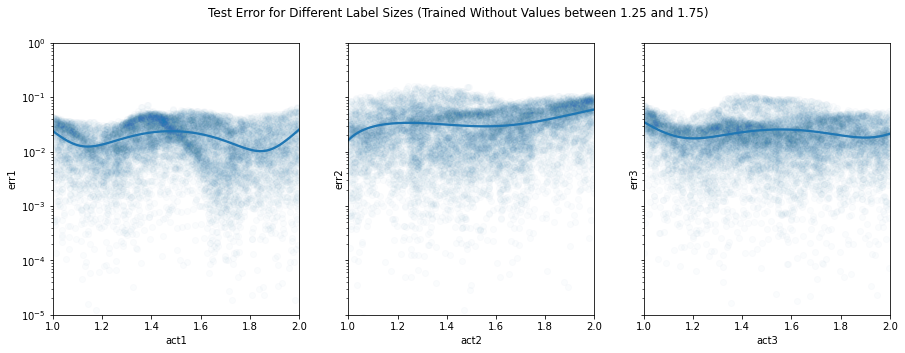

In [22]:
model = load_model('../Models/NN_Interpolate.h5')

df1 = pd.concat([pd.DataFrame(model.predict(x_test)), pd.DataFrame(y_test.values)], axis=1)
df1.columns = ['pred1', 'pred2', 'pred3', 'act1', 'act2', 'act3']

df1['err1'] = (df1['pred1'] - df1['act1']).abs()
df1['err2'] = (df1['pred2'] - df1['act2']).abs()
df1['err3'] = (df1['pred3'] - df1['act3']).abs()

fig, ax = plt.subplots(ncols=3, figsize=(15,5), sharey=True)
sns.regplot(x = df1['act1'], y = df1['err1'], ax=ax[0], scatter_kws={'alpha':0.02}, order=4)
sns.regplot(x = df1['act2'], y = df1['err2'], ax=ax[1], scatter_kws={'alpha':0.02}, order=4)
sns.regplot(x = df1['act3'], y = df1['err3'], ax=ax[2], scatter_kws={'alpha':0.02}, order=4)
ax[0].set_ylim([10**-5, 10**0])
ax[1].set_ylim([10**-5, 10**0])
ax[2].set_ylim([10**-5, 10**0])

ax[0].set_xlim([1, 2])
ax[1].set_xlim([1, 2])
ax[2].set_xlim([1, 2])
ax[0].set(yscale="log")
ax[1].set(yscale="log")
ax[2].set(yscale="log")
fig.suptitle('Test Error for Different Label Sizes (Trained Without Values between 1.25 and 1.75)')
plt.savefig('../BatchSizeReduction/Graphs/InterpolateValErr.png')

plt.show()


In [23]:
model.evaluate(x_train, y_train), model.evaluate(x_test, y_test)

8795/8795 [==============================] - 1s 91us/step


(0.00018443135330778395, 0.0010747130586823417)

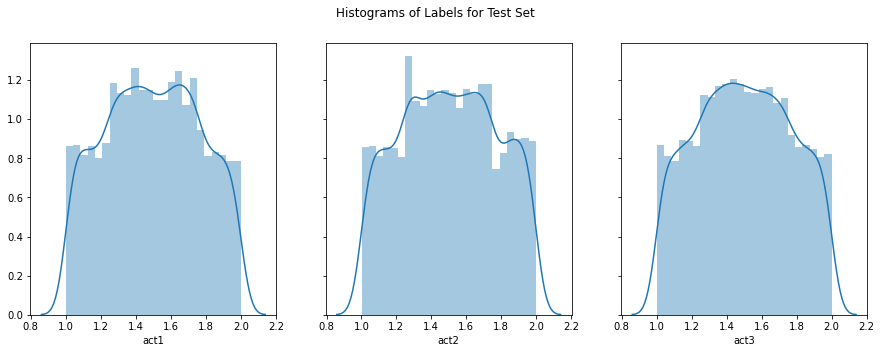

In [25]:
fig, ax = plt.subplots(ncols=3, figsize=(15,5), sharey=True)
sns.distplot(df1['act1'], ax=ax[0])
sns.distplot(df1['act2'], ax=ax[1])
sns.distplot(df1['act3'], ax=ax[2])
fig.suptitle('Histograms of Labels for Test Set')

plt.show()

We see here the model performed much better and was able to predict the unseen mid-range labels much more effectively. There was only a slight change in the error for these.

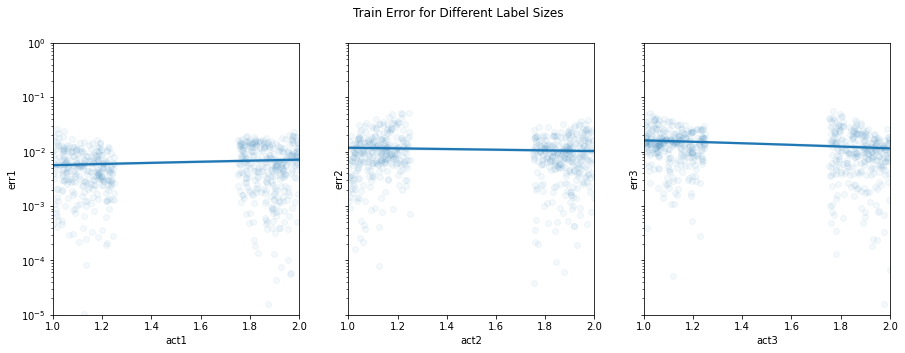

In [26]:
df2 = pd.concat([pd.DataFrame(model.predict(x_train)), pd.DataFrame(y_train.values)], axis=1)
df2.columns = ['pred1', 'pred2', 'pred3', 'act1', 'act2', 'act3']

df2['err1'] = (df2['pred1'] - df2['act1']).abs()
df2['err2'] = (df2['pred2'] - df2['act2']).abs()
df2['err3'] = (df2['pred3'] - df2['act3']).abs()

fig, ax = plt.subplots(ncols=3, figsize=(15,5), sharey=True)
sns.regplot(x = df2['act1'], y = df2['err1'], ax=ax[0],scatter_kws={'alpha':0.05})
sns.regplot(x = df2['act2'], y = df2['err2'], ax=ax[1],scatter_kws={'alpha':0.05})
sns.regplot(x = df2['act3'], y = df2['err3'], ax=ax[2],scatter_kws={'alpha':0.05})

ax[0].set_ylim([10**-5, 10**0])
ax[1].set_ylim([10**-5, 10**0])
ax[2].set_ylim([10**-5, 10**0])

ax[0].set_xlim([1, 2])
ax[1].set_xlim([1, 2])
ax[2].set_xlim([1, 2])

ax[0].set(yscale="log")
ax[1].set(yscale="log")
ax[2].set(yscale="log")
fig.suptitle('Train Error for Different Label Sizes')
plt.savefig('../BatchSizeReduction/Graphs/InterpolateTrainErr.png')

plt.show()

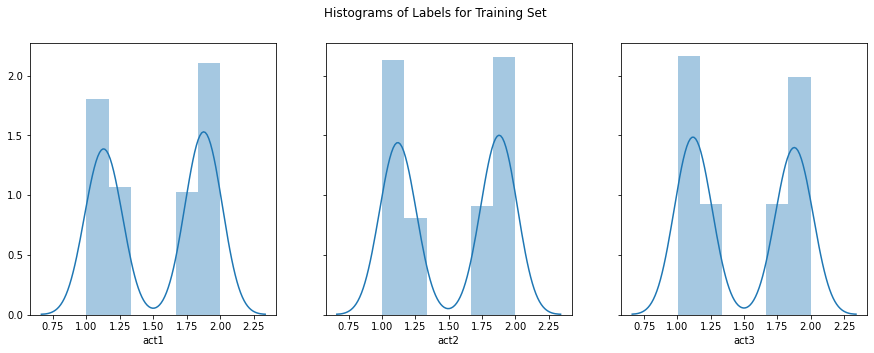

In [27]:
fig, ax = plt.subplots(ncols=3, figsize=(15,5), sharey=True)
sns.distplot(df2['act1'], ax=ax[0])
sns.distplot(df2['act2'], ax=ax[1])
sns.distplot(df2['act3'], ax=ax[2])
fig.suptitle('Histograms of Labels for Training Set')
plt.show()